# Bonus: non-symbol repeating pattern (toilet fixtures)

The spec's bonus invites the same matching pipeline to handle
patterns that are *not* clean, isolated symbols. Examples it gives:
hatches, shaded regions, wall-type markings.

So we use a **toilet fixture** as the bonus reference. If the same S4 pipeline (with looser thresholds
to accommodate a larger, richer pattern) finds them, that is
evidence the approach generalises beyond the callout case.

In [9]:
import sys, os
from pathlib import Path
PKG_ROOT = Path.cwd().parents[0] if Path.cwd().name == 'notebooks' else Path.cwd()
sys.path.insert(0, str(PKG_ROOT / 'src'))
os.chdir(PKG_ROOT)

import warnings
warnings.filterwarnings('ignore')

import numpy as np, cv2, matplotlib.pyplot as plt
from IPython.display import display, Image
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 80

## 1. Pick the reference: a toilet fixture on page 0


toilet reference shape: (95, 80)


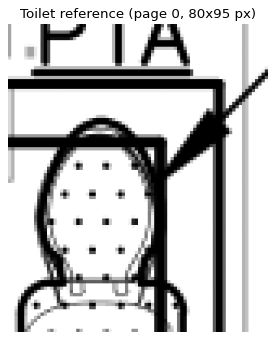

In [ ]:
from symbol_matching import benchmark, pdf_io, viz
from symbol_matching.strategies import s4_hybrid

pages = [pdf_io.render_page(benchmark.CD_SET_PDF, i, dpi=benchmark.DPI) for i in range(3)]
metas = [pdf_io.extract_metadata(benchmark.CD_SET_PDF, i) for i in range(3)]


TOILET_BBOX = dict(x=4410, y=4040, w=80, h=95)
b = TOILET_BBOX
toilet_ref = pages[0][b['y']:b['y']+b['h'], b['x']:b['x']+b['w']]
print('toilet reference shape:', toilet_ref.shape)


plt.figure(figsize=(5, 5))
plt.imshow(cv2.resize(toilet_ref, (toilet_ref.shape[1]*4, toilet_ref.shape[0]*4),
                      interpolation=cv2.INTER_NEAREST), cmap='gray')
plt.title(f"Toilet reference (page 0, {b['w']}x{b['h']} px)")
plt.axis('off'); plt.show()

## 2. Run S4 across all three plumbing pages

In [6]:
import time, os
os.makedirs('outputs/bonus', exist_ok=True)

all_matches = []
for pi in range(3):
    meta = metas[pi]
    t0 = time.time()
    matches = s4_hybrid.find_matches_on_page(
        pages[pi], toilet_ref,
        stage_a_threshold=0.50,
        stage_b_accept_threshold=0.60,
        stage_c_min_proposals=3,
        stage_c_threshold=0.80,
        page_idx=pi,
        page_meta={'sheet_ref': meta.sheet_ref,
                   'page_name': meta.page_name,
                   'page_type': meta.page_type},
    )
    dt = time.time() - t0
    fb = sum(1 for m in matches if m.item.stage == 'fallback')
    print(f'p{pi} ({meta.sheet_ref}): {len(matches)} matches ({fb} from Stage C) in {dt:.1f}s')
    viz.save_annotated(pages[pi], matches,
                       f'outputs/bonus/p{pi}_toilets.png',
                       thickness=6, color=(0, 0, 255))
    all_matches.append(matches)

Loading weights:   0%|          | 0/211 [00:00<?, ?it/s]

p0 (P120): 9 matches (7 from Stage C) in 199.7s
p1 (P121): 10 matches (9 from Stage C) in 194.7s
p2 (P130): 0 matches (0 from Stage C) in 195.2s


## 3. annotated page 0


In [7]:
display(Image(filename='outputs/bonus/p0_toilets.png'))